In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

import rasterio
import geopandas as gpd

from shapely.geometry import Polygon

import iceplant_detection_functions as ipf

In [2]:
fp = os.path.join(os.getcwd(),'training_set','aux_data','naip_point_samples',
                  'ca_m_3411934_sw_11_060_20200521_points.csv')
features2020 = pd.read_csv(fp)

fp = os.path.join(os.getcwd(),'training_set','aux_data','naip_point_samples',
                  'ca_m_3412037_nw_10_060_20200607_points.csv')
features2020 = pd.concat([features2020,pd.read_csv(fp)])

features2020.drop(['geometry','Unnamed: 0','x','y','day','year'],axis=1,inplace=True)
ipf.iceplant_proportions(features2020.iceplant.to_numpy())

no-iceplant:iceplant ratio     7.2 :1
          counts  percentage
iceplant                    
0         115812       87.84
1          16027       12.16



In [5]:
train_features, test_features, train_labels, test_labels = ipf.test_train_from_df(features_df)

ipf.train_test_shapes(train_features, train_labels, test_features, test_labels)
ipf.test_train_proportions(train_labels, test_labels)

Training Features Shape: (92287, 5)
Training Labels Shape: (92287,)
Testing Features Shape: (39552, 5)
Testing Labels Shape: (39552,)

TRAIN SET COUNTS:
no-iceplant:iceplant ratio     7.2 :1
          counts  percentage
iceplant                    
0          81047       87.82
1          11240       12.18

TEST SET COUNTS:
no-iceplant:iceplant ratio     7.3 :1
          counts  percentage
iceplant                    
0          34765        87.9
1           4787        12.1



In [6]:
rfc = RandomForestClassifier(n_estimators = 100, 
                                      random_state = 42)
rfc.fit(train_features,train_labels)

predictions = rfc.predict(test_features)
ipf.print_threshold_metrics(test_labels, predictions)


true negatives: 34575     false positives: 190
false negatives: 306     true positives: 4481

sensitivity (TP/P): 93.61 %
specificity (TN/N): 99.45 %
G-mean:  0.96

precision (TP/(TP+FP)): 95.93 %

MCC:  0.9405283672168937

F1-measure:  0.94756
F0.5-measure (min false positives):  0.95458
F2-measure (min false negatives)  :  0.94064

accuracy: 98.75 %



In [7]:
aois = gpd.read_file(os.path.join(os.getcwd(),'areas_of_interest','areas_of_interest.shp'))

In [10]:
def mask_ndvi_add_my_and_predict(itemid, reduce_box, rfc, month, is_2018):
    image = ipf.open_window_in_scene(itemid, reduce_box)
    veg = ipf.select_ndvi_df(image)
    veg['month'] = month
    veg['2018'] = is_2018
    index = veg.index
    features = np.array(veg)
    predictions_class = rfc.predict(features)
    c = {'prediction': predictions_class}
    predictions_df = pd.DataFrame(c, index = index)
    
    return ipf. df_backto_image(image,predictions_df)

# -----------------------------------------------------------------------------------

def mask_ndvi_add_m_and_predict(itemid, reduce_box, rfc, month):
    image = ipf.open_window_in_scene(itemid, reduce_box)
    veg = ipf.select_ndvi_df(image)
    veg['month'] = month

    index = veg.index
    features = np.array(veg)
    predictions_class = rfc.predict(features)
    c = {'prediction': predictions_class}
    predictions_df = pd.DataFrame(c, index = index)
    
    return ipf. df_backto_image(image,predictions_df)

/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:209: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)
/tmp/ipykernel_1167/2714382924.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veg['month'] = month


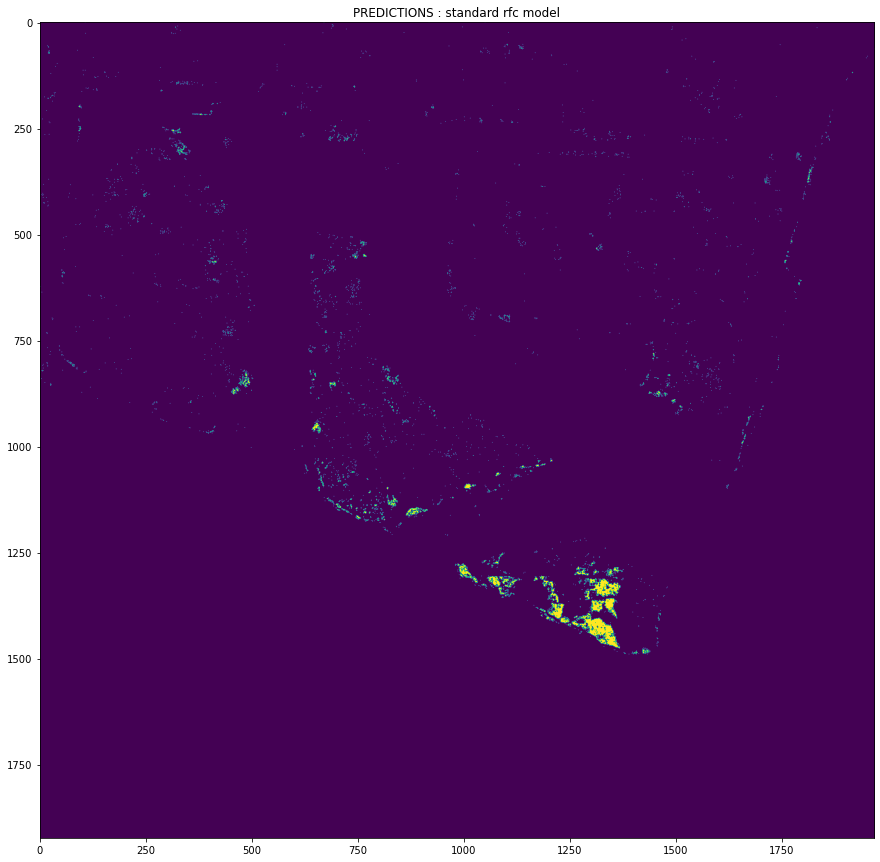

In [11]:
cp = aois.iloc[0]  # Campus Lagoon aoi
cp_itemid= 'ca_m_3411934_sw_11_060_20200521'
predictions = mask_ndvi_add_date_and_predict(cp_itemid, cp.geometry, rfc, 5)

fig, ax = plt.subplots(figsize=(15, 15))
plt.title("PREDICTIONS : standard rfc model")
ax.imshow(predictions)
plt.show()

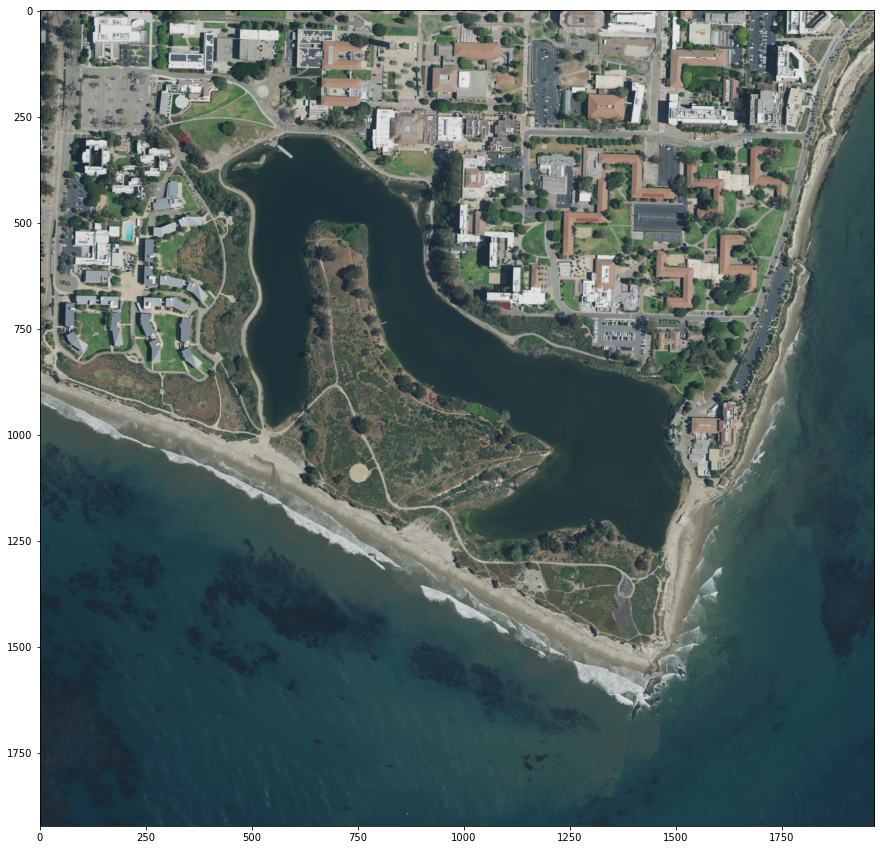

In [12]:
ipf.plot_window_in_scene(cp_itemid, cp.geometry)

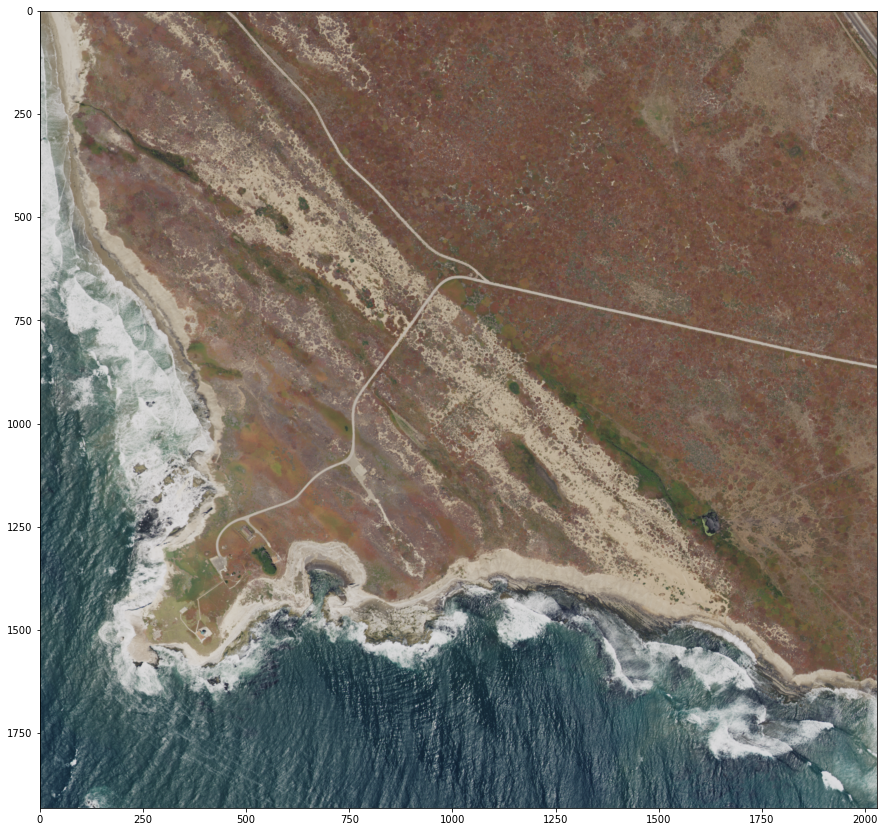

In [13]:
conc = aois.iloc[4]  # Conception Point
conc_itemid='ca_m_3412037_nw_10_060_20200607'
ipf.plot_window_in_scene(conc_itemid, conc.geometry)

/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:209: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)
/tmp/ipykernel_1167/2714382924.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veg['month'] = month


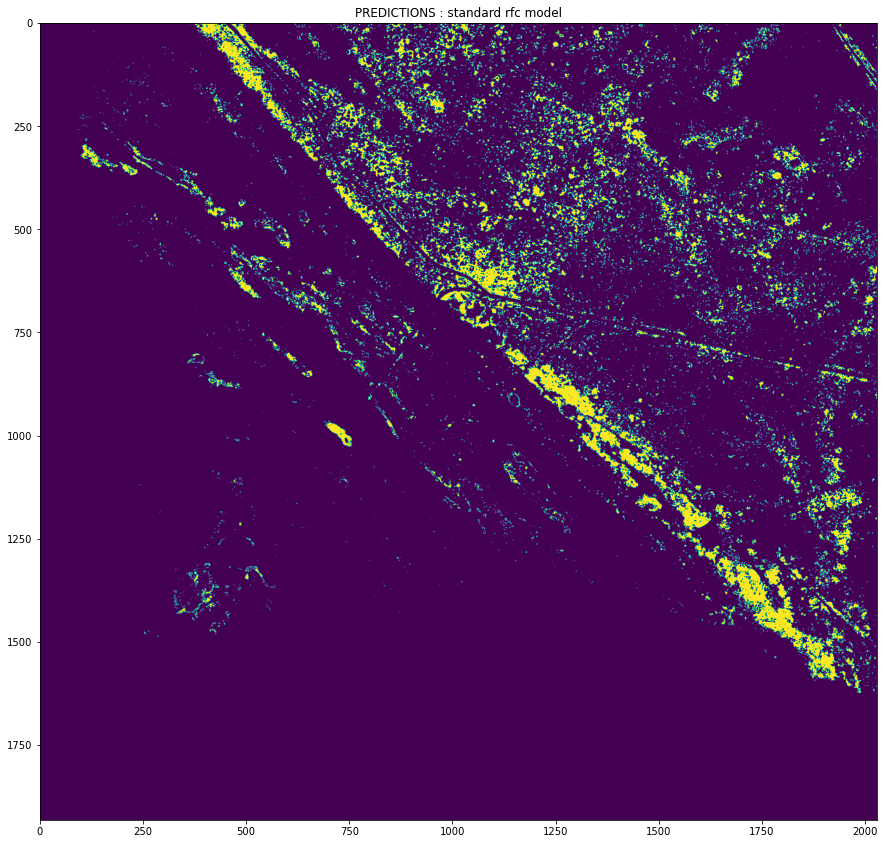

In [14]:
predictions = mask_ndvi_add_date_and_predict(conc_itemid, conc.geometry, rfc, 6)

fig, ax = plt.subplots(figsize=(15, 15))
plt.title("PREDICTIONS : standard rfc model")
ax.imshow(predictions)
plt.show()

# ADDING ALL YEARS

In [3]:
fp = os.path.join(os.getcwd(),'training_set','aux_data','dangermond_and_campuspoint.csv')
features2018 = pd.read_csv(fp)

fp = os.path.join(os.getcwd(),'training_set','aux_data','dangermond_non_iceplant.csv')
features2018 = pd.concat([features2018,pd.read_csv(fp)])

features2018.drop(['geometry','Unnamed: 0','x','y','day','year'],axis=1,inplace=True)
ipf.iceplant_proportions(features2018.iceplant.to_numpy())

no-iceplant:iceplant ratio     3.8 :1
          counts  percentage
iceplant                    
0          20999       79.04
1           5567       20.96



In [30]:
# one-hot encoding
features2018['2018']=1
features2020['2018']=0

In [5]:
all_years = pd.concat([features2018,features2020])
all_years

,iceplant,r,g,b,nir,month
0,1,93,88,93,141,7
1,1,85,85,89,137,7
2,1,89,85,91,133,7
3,1,92,87,95,134,7
4,1,86,81,88,137,7
...,...,...,...,...,...,...
47386,0,103,103,78,111,6
47387,0,105,97,81,96,6
47388,0,79,82,63,108,6
47389,0,90,86,72,109,6


In [34]:
ipf.iceplant_proportions(all_years.iceplant.to_numpy())

no-iceplant:iceplant ratio     6.3 :1
          counts  percentage
iceplant                    
0         136811       86.37
1          21594       13.63



In [37]:
train_features, test_features, train_labels, test_labels = ipf.test_train_from_df(all_years)

rfc = RandomForestClassifier(n_estimators = 100, random_state = 42)
rfc.fit(train_features,train_labels)

predictions = rfc.predict(test_features)
ipf.print_threshold_metrics(test_labels, predictions)


true negatives: 40669     false positives: 264
false negatives: 439     true positives: 6150

sensitivity (TP/P): 93.34 %
specificity (TN/N): 99.36 %
G-mean:  0.96

precision (TP/(TP+FP)): 95.88 %

MCC:  0.9374824142149191

F1-measure:  0.94594
F0.5-measure (min false positives):  0.95364
F2-measure (min false negatives)  :  0.93836

accuracy: 98.52 %



/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:209: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)
/tmp/ipykernel_1167/2501285651.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veg['month'] = month
/tmp/ipykernel_1167/2501285651.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

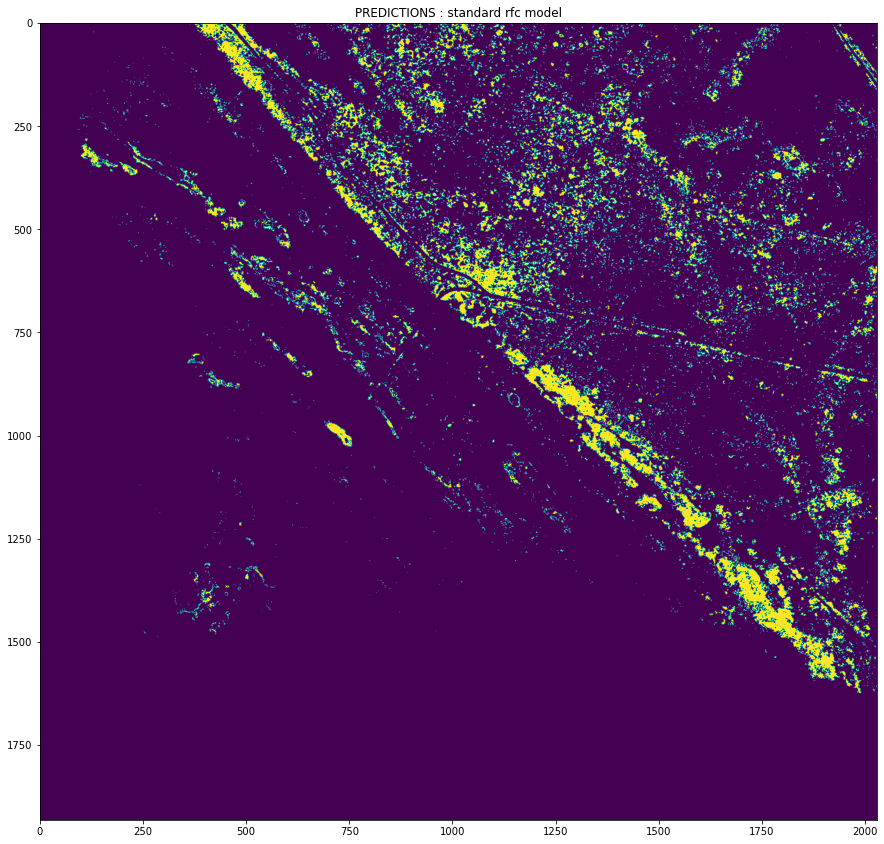

In [40]:
predictions = mask_ndvi_add_date_and_predict(conc_itemid, conc.geometry, rfc, month=6, is_2018=0)

fig, ax = plt.subplots(figsize=(15, 15))
plt.title("PREDICTIONS : standard rfc model")
ax.imshow(predictions)
plt.show()

/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:209: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)
/tmp/ipykernel_1167/2501285651.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veg['month'] = month
/tmp/ipykernel_1167/2501285651.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

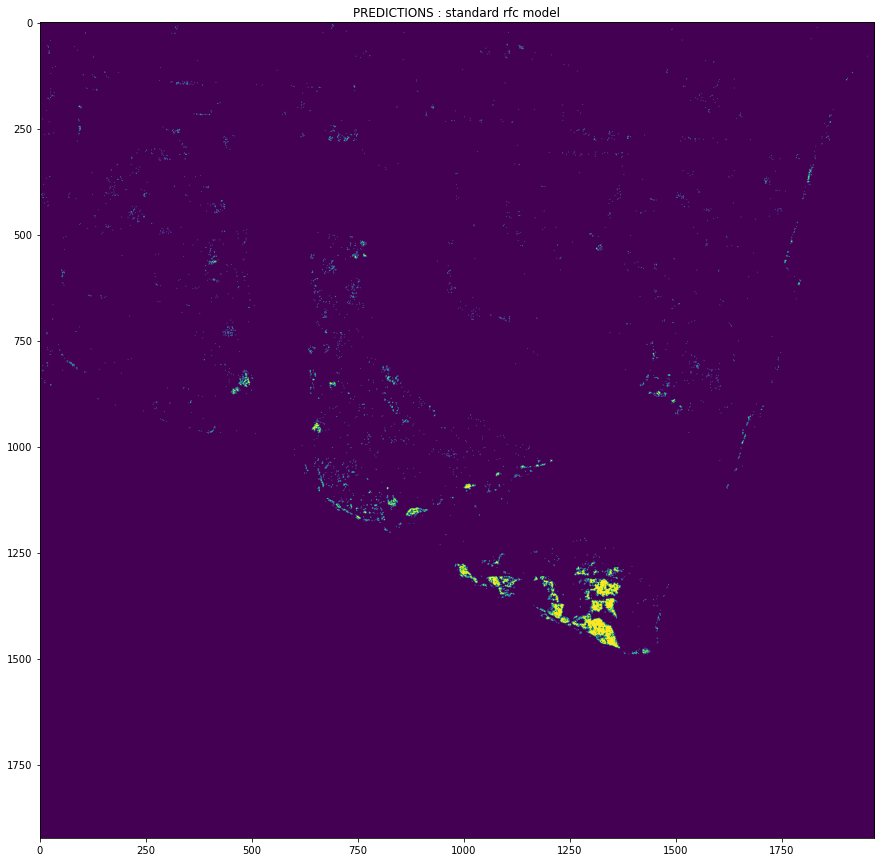

In [41]:
cp_itemid= 'ca_m_3411934_sw_11_060_20200521'
predictions = mask_ndvi_add_date_and_predict(cp_itemid, cp.geometry, rfc, 5, is_2018=0)

fig, ax = plt.subplots(figsize=(15, 15))
plt.title("PREDICTIONS : standard rfc model")
ax.imshow(predictions)
plt.show()

/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:209: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)
/tmp/ipykernel_1167/2501285651.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veg['month'] = month
/tmp/ipykernel_1167/2501285651.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

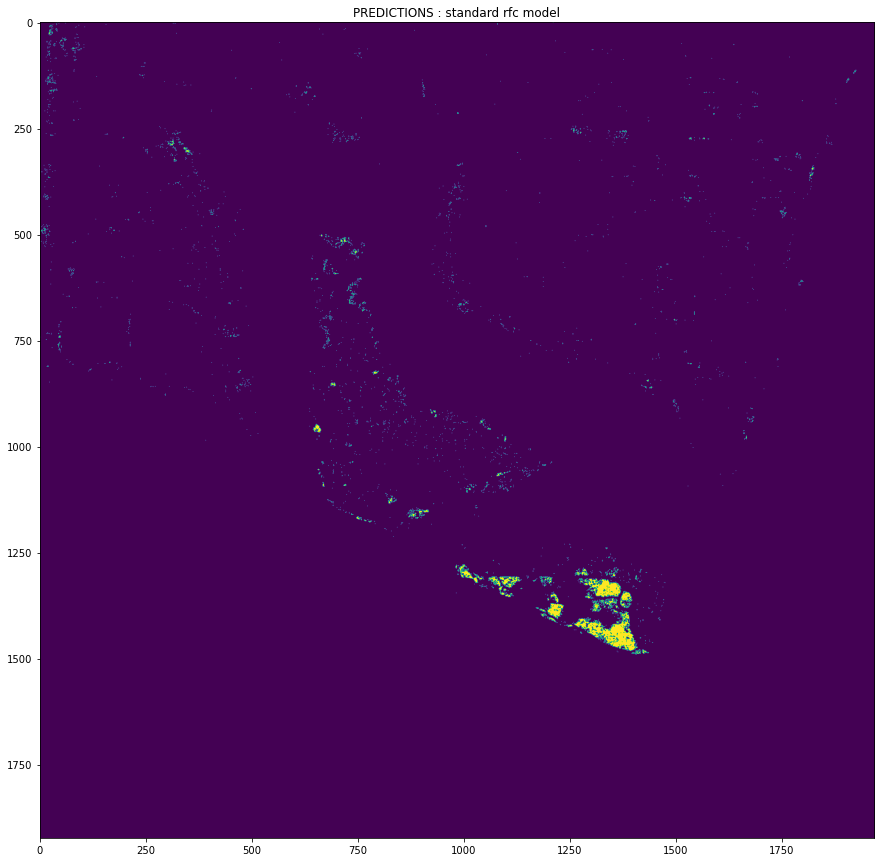

In [42]:
predictions = mask_ndvi_add_date_and_predict(cp.itemid, cp.geometry, rfc, month=7, is_2018=1)

fig, ax = plt.subplots(figsize=(15, 15))
plt.title("PREDICTIONS : standard rfc model")
ax.imshow(predictions)
plt.show()

# Not adding year

In [44]:
all_months = all_years.drop('2018',axis=1)
all_months

,iceplant,r,g,b,nir,month
0,1,93,88,93,141,7
1,1,85,85,89,137,7
2,1,89,85,91,133,7
3,1,92,87,95,134,7
4,1,86,81,88,137,7
...,...,...,...,...,...,...
47386,0,103,103,78,111,6
47387,0,105,97,81,96,6
47388,0,79,82,63,108,6
47389,0,90,86,72,109,6


In [8]:
train_features, test_features, train_labels, test_labels = ipf.test_train_from_df(all_years)

rfc = RandomForestClassifier(n_estimators = 100, random_state = 42)
rfc.fit(train_features,train_labels)

predictions = rfc.predict(test_features)
ipf.print_threshold_metrics(test_labels, predictions)


true negatives: 40668     false positives: 265
false negatives: 433     true positives: 6156

sensitivity (TP/P): 93.43 %
specificity (TN/N): 99.35 %
G-mean:  0.96

precision (TP/(TP+FP)): 95.87 %

MCC:  0.9379469114007759

F1-measure:  0.94635
F0.5-measure (min false positives):  0.95374
F2-measure (min false negatives)  :  0.93907

accuracy: 98.53 %



In [6]:
cp_itemid= 'ca_m_3411934_sw_11_060_20200521'
conc_itemid='ca_m_3412037_nw_10_060_20200607'
aois = gpd.read_file(os.path.join(os.getcwd(),'areas_of_interest','areas_of_interest.shp'))
conc = aois.iloc[4]

/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:209: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)
/tmp/ipykernel_1349/230525153.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veg['month'] = month


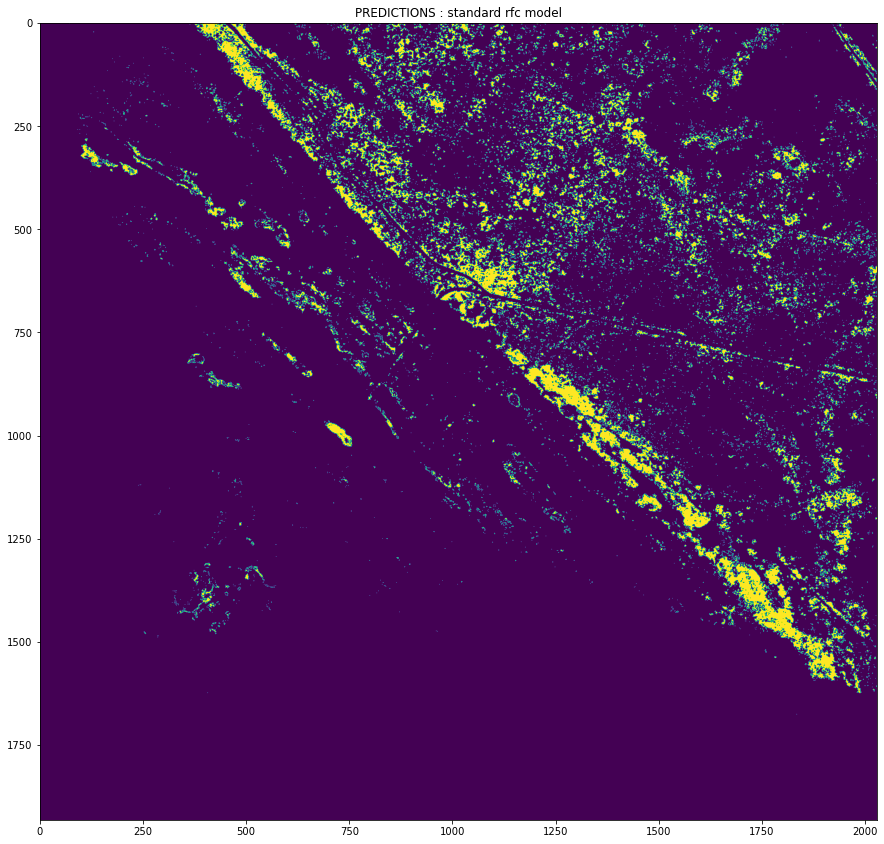

In [ ]:
predictions = mask_ndvi_add_m_and_predict(conc_itemid, conc.geometry, rfc, month=6)

fig, ax = plt.subplots(figsize=(15, 15))
plt.title("PREDICTIONS : standard rfc model")
ax.imshow(predictions)
plt.show()

In [2]:
fp = os.path.join(os.getcwd(),'training_set','aux_data','naip_point_samples',
                  'ca_m_3412037_nw_10_060_20200607_points.csv')
dang2020 = pd.read_csv(fp)
dang2020.drop(['geometry','Unnamed: 0','x','y','day','year'],axis=1,inplace=True)
ipf.iceplant_proportions(dang2020.iceplant.to_numpy())

no-iceplant:iceplant ratio     2.4 :1
          counts  percentage
iceplant                    
0          33307       70.28
1          14084       29.72



In [3]:
dang2020.drop('month',axis=1,inplace=True)
dang2020.head(3)

,iceplant,r,g,b,nir
0,1,147,115,87,163
1,1,126,100,71,149
2,1,145,117,87,161


In [4]:
train_features, test_features, train_labels, test_labels = ipf.test_train_from_df(dang2020)

rfc_dang2020 = RandomForestClassifier(n_estimators = 100, random_state = 42)
rfc_dang2020.fit(train_features,train_labels)

predictions = rfc_dang2020.predict(test_features)
ipf.print_threshold_metrics(test_labels, predictions)


true negatives: 9847     false positives: 103
false negatives: 104     true positives: 4164

sensitivity (TP/P): 97.56 %
specificity (TN/N): 98.96 %
G-mean:  0.98

precision (TP/(TP+FP)): 97.59 %

MCC:  0.9653454507983816

F1-measure:  0.97575
F0.5-measure (min false positives):  0.97582
F2-measure (min false negatives)  :  0.97568

accuracy: 98.54 %



/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:208: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)


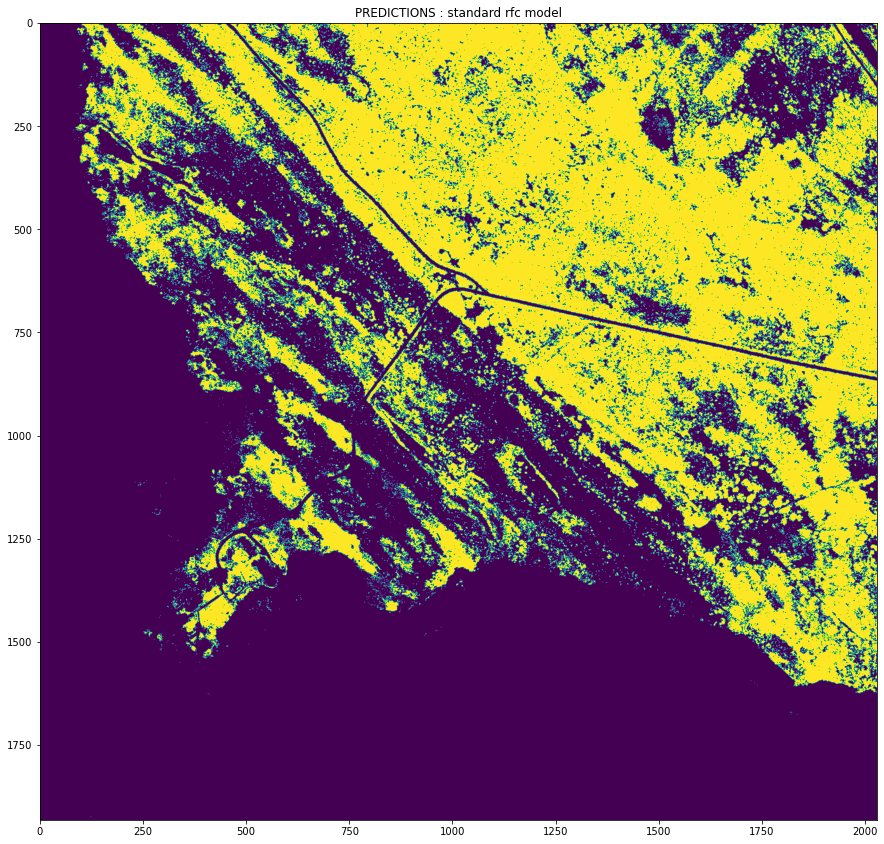

In [27]:
predictions = ipf.mask_ndvi_and_predict(conc_itemid, conc.geometry, rfc_dang2020, thresh=0.05)

fig, ax = plt.subplots(figsize=(15, 15))
plt.title("PREDICTIONS : standard rfc model")
ax.imshow(predictions)
plt.show()

In [10]:
dang2020_ndvi = ipf.select_ndvi_image(conc_itemid, conc.geometry, thresh=0.1)

/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:208: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)


/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:209: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)


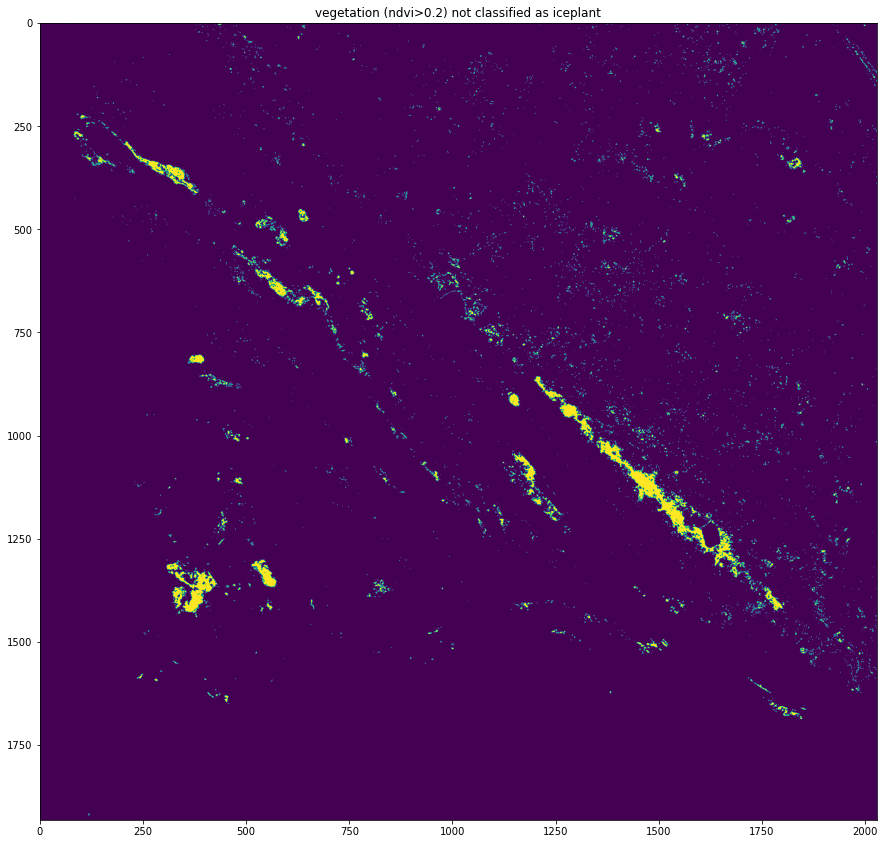

In [22]:
diff = dang2020_ndvi - predictions
fig, ax = plt.subplots(figsize=(15, 15))
plt.title('vegetation (ndvi>0.2) not classified as iceplant')
ax.imshow(diff)
plt.show()

/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:208: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)


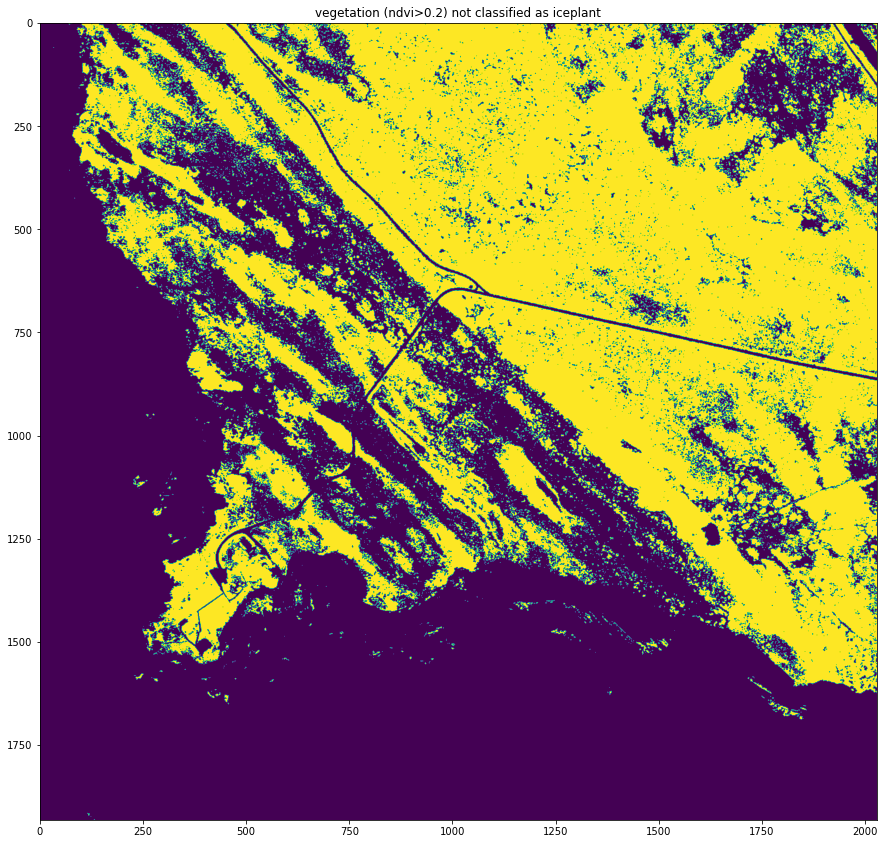

In [14]:
dang2020_ndvi = ipf.select_ndvi_image(conc_itemid, conc.geometry, thresh=0.05)
fig, ax = plt.subplots(figsize=(15, 15))
plt.title('vegetation (ndvi>0.2) not classified as iceplant')
ax.imshow(dang2020_ndvi)
plt.show()

/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:208: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)


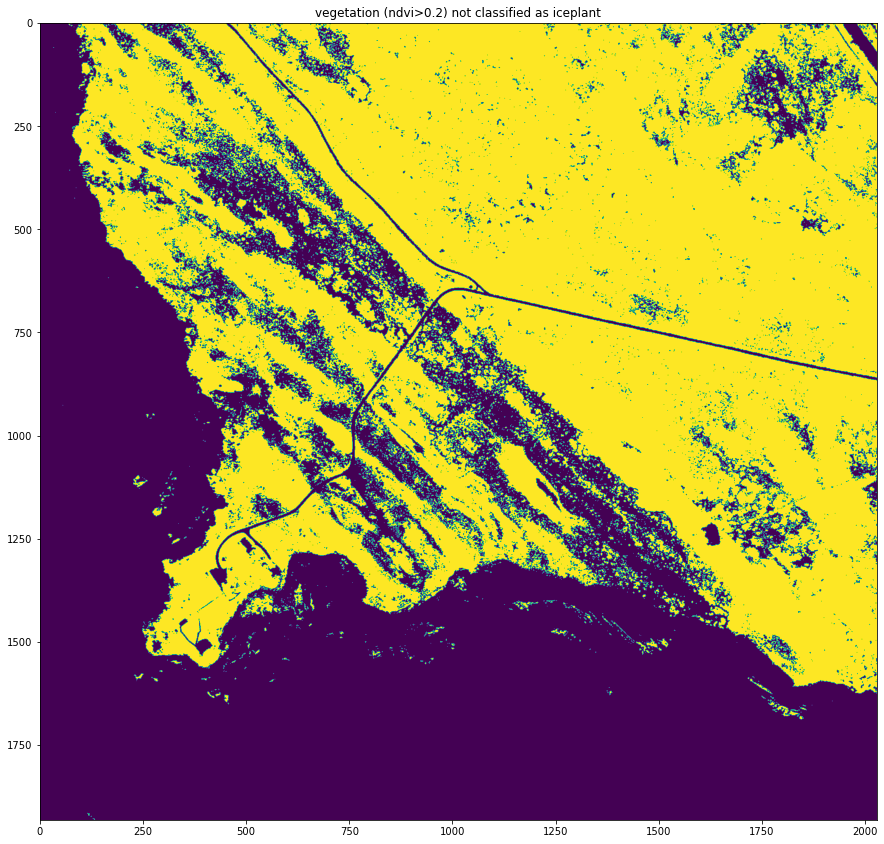

In [12]:
dang2020_ndvi = ipf.select_ndvi_image(conc_itemid, conc.geometry, thresh=0)
fig, ax = plt.subplots(figsize=(15, 15))
plt.title('vegetation (ndvi>0.2) not classified as iceplant')
ax.imshow(dang2020_ndvi)
plt.show()

/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:208: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)


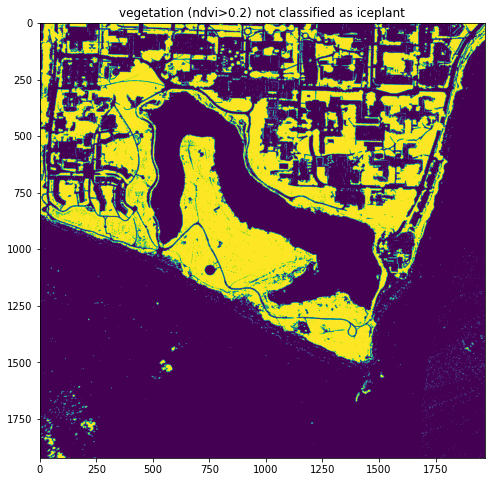

In [17]:
cp = aois.iloc[0]
cp2018_ndvi = ipf.select_ndvi_image(cp.itemid, cp.geometry, thresh=0)
fig, ax = plt.subplots(figsize=(8, 8))
plt.title('vegetation (ndvi>0.2) not classified as iceplant')
ax.imshow(cp2018_ndvi)
plt.show()

/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:208: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)


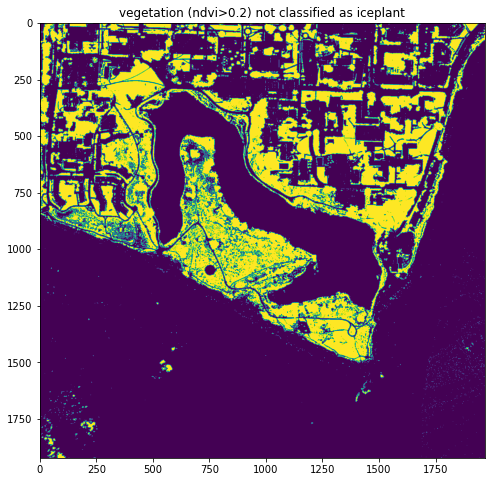

In [26]:
cp2018_ndvi = ipf.select_ndvi_image(cp.itemid, cp.geometry, thresh=0.05)
fig, ax = plt.subplots(figsize=(8, 8))
plt.title('vegetation (ndvi>0.2) not classified as iceplant')
ax.imshow(cp2018_ndvi)
plt.show()

/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:208: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)


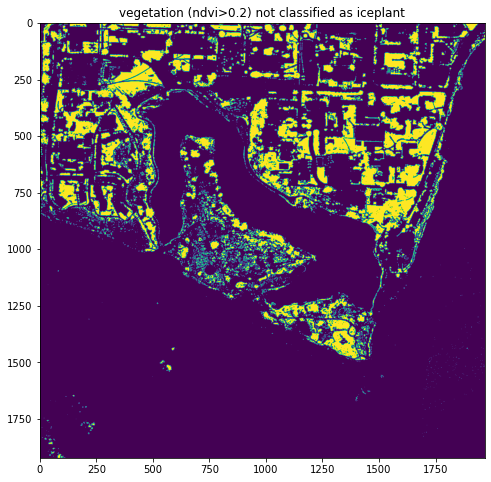

In [19]:
cp2018_ndvi = ipf.select_ndvi_image(cp.itemid, cp.geometry, thresh=0.2)
fig, ax = plt.subplots(figsize=(8, 8))
plt.title('vegetation (ndvi>0.2) not classified as iceplant')
ax.imshow(cp2018_ndvi)
plt.show()

/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:208: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)


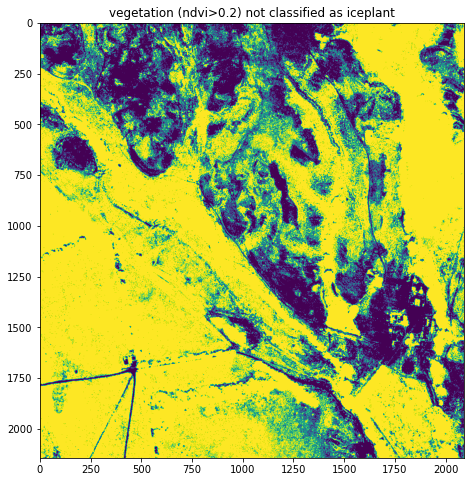

In [21]:
dgm_box = Polygon([[-120.4562449253,34.4542691265],
                    [-120.4429462156,34.4542691265],
                    [-120.4429462156,34.4655867726],
                    [-120.4562449253,34.4655867726],
                    [-120.4562449253,34.4542691265]])

inland2018_ndvi = ipf.select_ndvi_image(aois.iloc[4].itemid, dgm_box, thresh=0)
fig, ax = plt.subplots(figsize=(8, 8))
plt.title('vegetation (ndvi>0.2) not classified as iceplant')
ax.imshow(inland2018_ndvi)
plt.show()

/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:208: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)


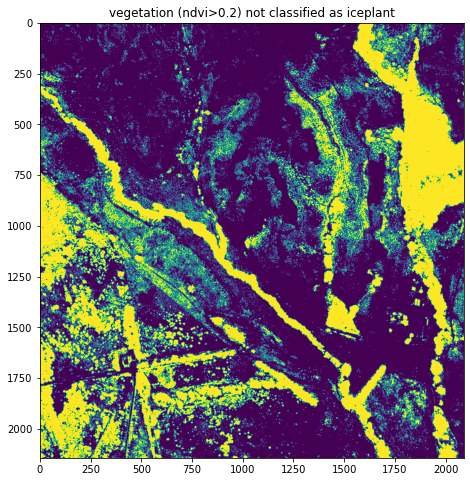

In [24]:
inland2018_ndvi = ipf.select_ndvi_image(aois.iloc[4].itemid, dgm_box, thresh=0.05)
fig, ax = plt.subplots(figsize=(8, 8))
plt.title('vegetation (ndvi>0.2) not classified as iceplant')
ax.imshow(inland2018_ndvi)
plt.show()

/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:208: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)


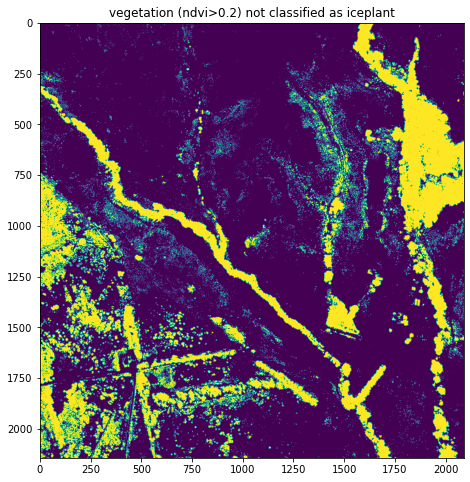

In [25]:
inland2018_ndvi = ipf.select_ndvi_image(aois.iloc[4].itemid, dgm_box, thresh=0.1)
fig, ax = plt.subplots(figsize=(8, 8))
plt.title('vegetation (ndvi>0.2) not classified as iceplant')
ax.imshow(inland2018_ndvi)
plt.show()

/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:208: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)


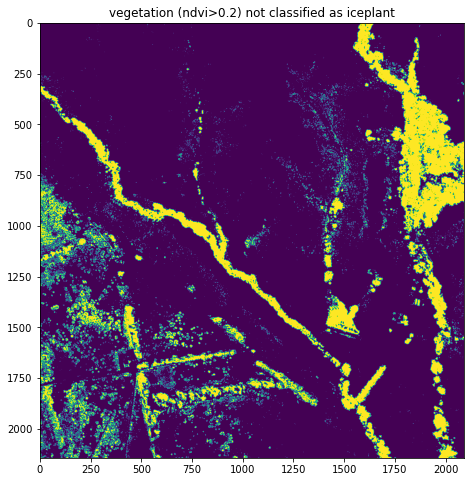

In [23]:
inland2018_ndvi = ipf.select_ndvi_image(aois.iloc[4].itemid, dgm_box, thresh=0.2)
fig, ax = plt.subplots(figsize=(8, 8))
plt.title('vegetation (ndvi>0.2) not classified as iceplant')
ax.imshow(inland2018_ndvi)
plt.show()